## SD1.5-Inpainting + IP-Adapter: Regional Style Transfer

Getting IP-Adapter working on SD1.5 to replace the NST placeholder. Should give proper spatial style control through cross-attention rather than global Gram matrix matching

Pipeline: Grounding DINO + SAM for masks, IP-Adapter for style conditioning, SD1.5-Inpainting for region-aware generation.


In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

## Setup: imports, paths, and helper functions

Loading libraries and defining the helper functions used throughout the notebook.
`boundary_band_lpips` restricts the LPIPS metric to a narrow ring around the mask
edge rather than the full image, which separates boundary leakage from style quality
inside the region. `parse_instruction` handles the structured "style X like Y and Z
like W" format used across all experiments.

In [2]:
import os, json, re, requests, gc
import numpy as np
import cv2
import torch
from PIL import Image
from io import BytesIO
from datetime import datetime
import matplotlib.pyplot as plt

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'device: {DEVICE}')
print(f'GPU: {torch.cuda.get_device_name(0)}')
print(f'GPU free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')

OUT_DIR = os.path.expanduser('~/mllm_style_transfer/ip_adapter/outputs')
WT_DIR  = os.path.expanduser('~/mllm_style_transfer/ip_adapter/weights')
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(WT_DIR,  exist_ok=True)


def download_image(url, path=None, size=(512, 512)):
    # some CDNs block without a realistic user-agent
    r = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=30)
    img = Image.open(BytesIO(r.content)).convert('RGB').resize(size, Image.LANCZOS)
    if path:
        img.save(path)
        print(f'saved {path}')
    return img


def overlay_mask(image, mask, color=(255, 80, 80), alpha=0.4):
    arr = np.array(image.convert('RGB')).astype(float)
    ov = np.zeros_like(arr)
    ov[mask > 127] = color
    return Image.fromarray((arr*(1-alpha)+ov*alpha).astype(np.uint8))


def make_boundary_band(mask, band_px=15):
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px*2+1, band_px*2+1))
    return cv2.subtract(cv2.dilate(mask, k), cv2.erode(mask, k))


def boundary_band_lpips(lpips_fn, original, stylised, mask, band_px=15):
    band = make_boundary_band(mask, band_px)
    bt = torch.from_numpy((band > 127).astype(np.float32)).to(DEVICE)
    def to_t(img):
        arr = np.array(img.convert('RGB')).astype(np.float32) / 127.5 - 1.0
        return torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to(DEVICE) * bt
    with torch.no_grad():
        return lpips_fn(to_t(original), to_t(stylised)).item()


def parse_instruction(instruction):
    pairs = []
    matches = re.findall(
        r'(?:the\s+)?([a-zA-Z ]+?)\s+like\s+([A-Za-z_ ]+?)(?:\s+and\s+|\s*,\s*|$)',
        instruction, re.IGNORECASE
    )
    for region, style in matches:
        region = re.sub(r'^(style|make|render|paint)\s+', '', region.strip(), flags=re.IGNORECASE).strip()
        region = re.sub(r'^the\s+', '', region, flags=re.IGNORECASE).strip()
        style = style.strip().replace('_', ' ')
        if region and style:
            pairs.append({'region': region, 'style': style})
    return pairs


print('helpers ready')


device: cuda
GPU: NVIDIA GeForce RTX 2080
GPU free: 8.0 GB
helpers ready


downloading images...
saved /homes/rkr44/mllm_style_transfer/ip_adapter/outputs/content.jpg
saved /homes/rkr44/mllm_style_transfer/ip_adapter/outputs/style_vangogh.jpg
Van Gogh downloaded
saved /homes/rkr44/mllm_style_transfer/ip_adapter/outputs/style_monet.jpg
Monet downloaded


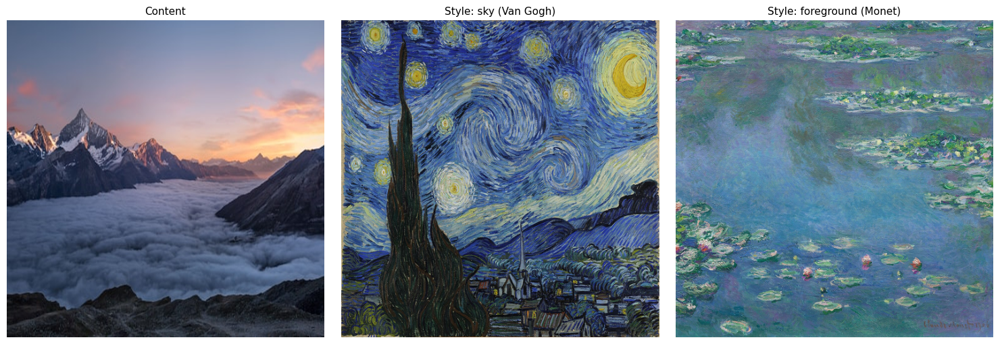

images ready


In [3]:
print('downloading images...')
content = download_image(
    'https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=512&q=80',
    f'{OUT_DIR}/content.jpg'
)

# Van Gogh Starry Night , style for sky
try:
    style_sky = download_image(
        'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1280px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
        f'{OUT_DIR}/style_vangogh.jpg'
    )
    print('Van Gogh downloaded')
except Exception:
    print('Wikimedia blocked, using fallback')
    style_sky = download_image(
        'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/mosaic.jpg',
        f'{OUT_DIR}/style_vangogh.jpg'
    )

# Monet Water Lilies - style for foreground
try:
    style_fore = download_image(
        'https://upload.wikimedia.org/wikipedia/commons/thumb/a/aa/Claude_Monet_-_Water_Lilies_-_1906%2C_Ryerson.jpg/1280px-Claude_Monet_-_Water_Lilies_-_1906%2C_Ryerson.jpg',
        f'{OUT_DIR}/style_monet.jpg'
    )
    print('Monet downloaded')
except Exception:
    print('Wikimedia blocked, using fallback')
    style_fore = download_image(
        'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/candy.jpg',
        f'{OUT_DIR}/style_monet.jpg'
    )

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, title in zip(axes, [content, style_sky, style_fore],
                           ['Content', 'Style: sky (Van Gogh)', 'Style: foreground (Monet)']):
    ax.imshow(img)
    ax.set_title(title, fontsize=11)
    ax.axis('off')
plt.tight_layout()
plt.show()
print('images ready')


## Region mask generation: Grounding DINO + SAM

Grounding DINO takes a text prompt and returns bounding boxes.
SAM then refines each box into a pixel-level mask.
The two-threshold fallback (0.3 then 0.15) handles cases where
DINO is not confident enough at the default threshold.
Masks are saved to disk so they can be reloaded without re-running
DINO and SAM if the kernel restarts before the inpainting cells.

/homes/rkr44/.local/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/opt/python/lib/python3.12/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/homes/rkr44/.local/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


DINO + SAM loaded | GPU free: 5.3 GB
segmenting sky...


/homes/rkr44/.local/lib/python3.12/site-packages/transformers/modeling_utils.py:1126: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/opt/python/lib/python3.12/site-packages/torch/_dynamo/eval_frame.py:745: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/opt/python/lib/python3.12/site-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/homes/rkr44/.local/lib/python3.12/site-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is depr

  DINO: 1 box(es) for "sky"
segmenting mountain...
  DINO: 4 box(es) for "mountain"


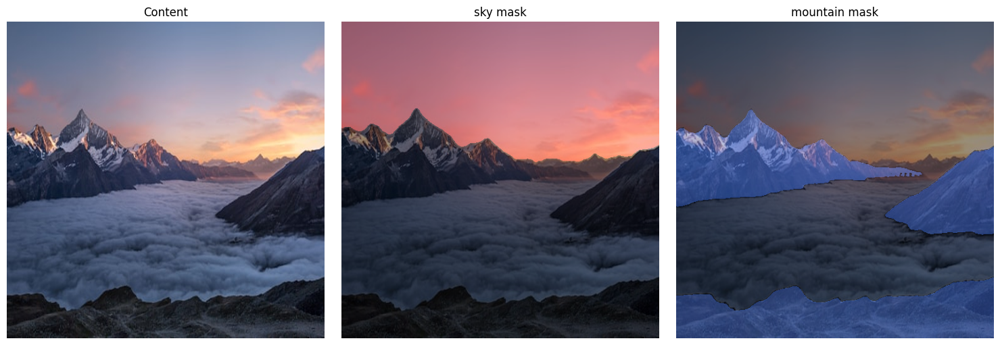

masks saved


In [4]:
import transformers as tf_module

# transformers >= 4.39 removed get_head_mask from BertModel
if not hasattr(tf_module.models.bert.modeling_bert.BertModel, 'get_head_mask'):
    from transformers.modeling_utils import ModuleUtilsMixin
    tf_module.models.bert.modeling_bert.BertModel.get_head_mask = \
        ModuleUtilsMixin.get_head_mask

gdino_pth = f'{WT_DIR}/gdino.pth'
gdino_cfg = f'{WT_DIR}/gdino_config.py'
sam_pth= f'{WT_DIR}/sam_vit_h.pth'

if not os.path.exists(gdino_pth):
    os.system(f'wget -q -O {gdino_pth} https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth')
if not os.path.exists(gdino_cfg):
    os.system(f'wget -q -O {gdino_cfg} https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py')
if not os.path.exists(sam_pth):
    os.system(f'wget -q -O {sam_pth} https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth')

from groundingdino.util.inference import load_model, predict
import groundingdino.datasets.transforms as T_gdino
from segment_anything import sam_model_registry, SamPredictor

gdino_model = load_model(gdino_cfg, gdino_pth)
sam= sam_model_registry['vit_h'](checkpoint=sam_pth).to(DEVICE)
sam_predictor = SamPredictor(sam)
print(f'DINO + SAM loaded | GPU free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')

gdino_transform = T_gdino.Compose([
    T_gdino.RandomResize([800], max_size=1333),
    T_gdino.ToTensor(),
    T_gdino.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])


def text_to_mask(image_pil, prompt, box_threshold=0.3, text_threshold=0.25):
    W, H = image_pil.size
    img_t, _ = gdino_transform(image_pil, None)
    boxes, scores, _ = predict(
        model=gdino_model, image=img_t, caption=prompt,
        box_threshold=box_threshold, text_threshold=text_threshold,
    )
    if len(boxes) == 0:
        boxes, scores, _ = predict(
            model=gdino_model, image=img_t, caption=prompt,
            box_threshold=0.15, text_threshold=0.15,
        )
    if len(boxes) == 0:
        print(f'  no box found for "{prompt}"')
        return np.zeros((H, W), dtype=np.uint8)
    boxes_px = boxes.clone()
    boxes_px[:, 0] = (boxes[:, 0] - boxes[:, 2] / 2) * W
    boxes_px[:, 1] = (boxes[:, 1] - boxes[:, 3] / 2) * H
    boxes_px[:, 2] = (boxes[:, 0] + boxes[:, 2] / 2) * W
    boxes_px[:, 3] = (boxes[:, 1] + boxes[:, 3] / 2) * H
    boxes_px = boxes_px.cpu().numpy()
    print(f'  DINO: {len(boxes)} box(es) for "{prompt}"')
    sam_predictor.set_image(np.array(image_pil.convert('RGB')))
    combined = np.zeros((H, W), dtype=np.uint8)
    for box in boxes_px:
        m, _, _ = sam_predictor.predict(
            point_coords=None, point_labels=None,
            box=np.array(box, dtype=np.float32)[None, :],
            multimask_output=False,
        )
        combined = np.maximum(combined, (m[0] * 255).astype(np.uint8))
    return combined


print('segmenting sky...')
mask_sky  = text_to_mask(content, 'sky')
print('segmenting mountain...')
mask_fore = text_to_mask(content, 'mountain')

Image.fromarray(mask_sky).save(f'{OUT_DIR}/mask_sky.png')
Image.fromarray(mask_fore).save(f'{OUT_DIR}/mask_fore.png')

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(content);axes[0].set_title('Content');axes[0].axis('off')
axes[1].imshow(overlay_mask(content, mask_sky));axes[1].set_title('sky mask');axes[1].axis('off')
axes[2].imshow(overlay_mask(content, mask_fore, (80,130,255))); axes[2].set_title('mountain mask');   axes[2].axis('off')
plt.tight_layout()
plt.show()
print('masks saved')


## Load SD1.5-Inpainting and IP-Adapter

DINO and SAM are deleted first to free GPU memory before loading the
diffusion models. SD1.5-Inpainting is used rather than SDXL because
the IP-Adapter weights were trained on SD1.5 features and both models
fit on the RTX 2080 (8GB) once the grounding models are cleared.

IP-Adapter injects style reference features into the U-Net cross-attention
layers during denoising, giving proper spatial style conditioning rather
than the global Gram matrix matching used in the NST baseline.

Masks are reloaded from disk at the end of this cell so the inpainting
cells work correctly even if the kernel was restarted after mask generation.

In [5]:
# free grounding models before loading diffusion backbone
del gdino_model, sam, sam_predictor
gc.collect()
torch.cuda.empty_cache()
print(f'GPU free after clearing DINO+SAM: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')

from diffusers import StableDiffusionInpaintPipeline
from ip_adapter import IPAdapter

# SD1.5 chosen because IP-Adapter weights are pretrained on SD1.5 features
# and both fit on 8GB in fp16 after clearing the grounding models
print('loading SD1.5-Inpainting...')
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    'runwayml/stable-diffusion-inpainting',
    torch_dtype=torch.float16,
    safety_checker=None,
    cache_dir=WT_DIR,
).to(DEVICE)
print(f'SD1.5 loaded | GPU free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')

ip_ckpt = f'{WT_DIR}/ip-adapter_sd15.bin'
if not os.path.exists(ip_ckpt):
    os.system(
        f'wget -q -O {ip_ckpt} '
        'https://huggingface.co/h94/IP-Adapter/resolve/main/models/ip-adapter_sd15.bin'
    )

ip_model = IPAdapter(
    sd_pipe=pipe,
    image_encoder_path='laion/CLIP-ViT-H-14-laion2B-s32B-b79K',
    ip_ckpt=ip_ckpt,
    device=DEVICE,
)
print(f'IP-Adapter loaded | GPU free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')


def inpaint_region(content_img, mask_arr, style_ref_img,
                   prompt='artistic style painting',
                   num_steps=30, guidance_scale=7.5, ip_scale=0.7,
                   seed=42):
    torch.manual_seed(seed)
    mask_pil = Image.fromarray(mask_arr).convert('L')
    result = ip_model.generate(
        pil_image=style_ref_img,
        prompt=prompt,
        negative_prompt='ugly, blurry, distorted, watermark',
        image=content_img,
        mask_image=mask_pil,
        num_samples=1,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        scale=ip_scale,
    )
    return result[0]


# reload masks in case kernel restarted between cells
mask_sky  = np.array(Image.open(f'{OUT_DIR}/mask_sky.png').convert('L'))
mask_fore = np.array(Image.open(f'{OUT_DIR}/mask_fore.png').convert('L'))
print('masks reloaded')


GPU free after clearing DINO+SAM: 8.0 GB
loading SD1.5-Inpainting...


unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/homes/rkr44/.local/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
An error occurred while trying to fetch /homes/rkr44/mllm_style_transfer/ip_adapter/weights/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /homes/rkr44/mllm_style_transfer/ip_adapter/weights/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /homes/rkr44/mllm_style_transfer/ip_adapter/weigh

SD1.5 loaded | GPU free: 5.8 GB
IP-Adapter loaded | GPU free: 4.4 GB
masks reloaded


## Single-region test: sky styled with Van Gogh reference

Running IP-Adapter on the sky region only to confirm spatial control
works before attempting multi-region. If the style bleeds into the
mountains or foreground here, it indicates a mask or ip_scale issue
rather than a multi-region conflict.

single-region: sky -> Van Gogh...


  0%|          | 0/30 [00:00<?, ?it/s]

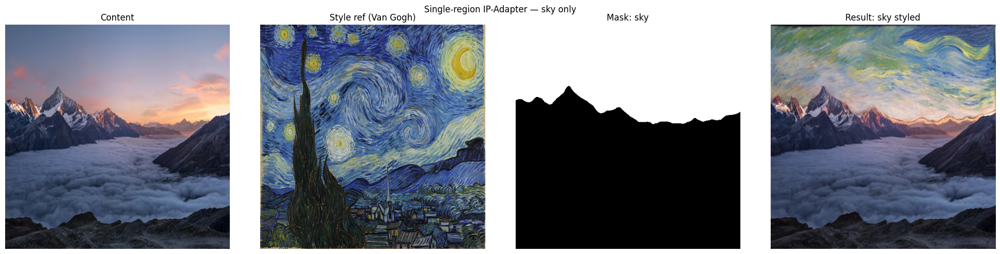

done


In [6]:
print('single-region: sky -> Van Gogh...')
result_sky = inpaint_region(
    content_img=content,
    mask_arr=mask_sky,
    style_ref_img=style_sky,
    prompt='sky painted in impressionist style, oil painting',
    ip_scale=0.7,
)
result_sky.save(f'{OUT_DIR}/result_sky_only.png')

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(content);axes[0].set_title('Content');axes[0].axis('off')
axes[1].imshow(style_sky);axes[1].set_title('Style ref (Van Gogh)'); axes[1].axis('off')
axes[2].imshow(Image.fromarray(mask_sky), cmap='gray');axes[2].set_title('Mask: sky');axes[2].axis('off')
axes[3].imshow(result_sky);axes[3].set_title('Result: sky styled');   axes[3].axis('off')
plt.suptitle('Single-region IP-Adapter — sky only', fontsize=12)
plt.tight_layout()
plt.show()
print('done')


## Multi-region: foreground styled with Monet reference

Sequential inpainting : the sky result is used as input for the
foreground pass so the two styled regions are composited naturally
rather than being generated independently and merged.
The five-panel output shows the progression: content, both style
references, after sky only, and the final two-region result.

multi-region: foreground -> Monet...


  0%|          | 0/30 [00:00<?, ?it/s]

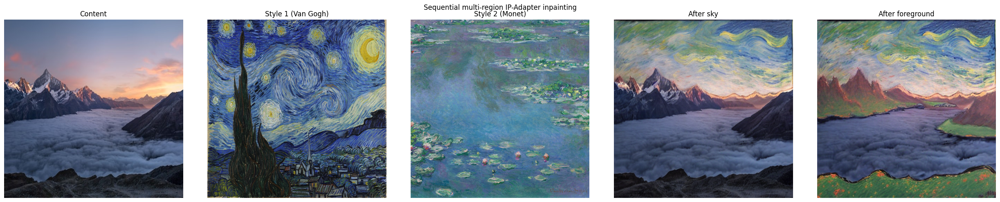

done


In [7]:
print('multi-region: foreground -> Monet...')
result_multi = inpaint_region(
    content_img=result_sky,
    mask_arr=mask_fore,
    style_ref_img=style_fore,
    prompt='mountains landscape in impressionist style, oil painting',
    ip_scale=0.7,
)
result_multi.save(f'{OUT_DIR}/result_multi_region.png')

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
axes[0].imshow(content);axes[0].set_title('Content');axes[0].axis('off')
axes[1].imshow(style_sky);axes[1].set_title('Style 1 (Van Gogh)'); axes[1].axis('off')
axes[2].imshow(style_fore);   axes[2].set_title('Style 2 (Monet)');axes[2].axis('off')
axes[3].imshow(result_sky);   axes[3].set_title('After sky');axes[3].axis('off')
axes[4].imshow(result_multi); axes[4].set_title('After foreground');axes[4].axis('off')
plt.suptitle('Sequential multi-region IP-Adapter inpainting', fontsize=12)
plt.tight_layout()
plt.show()
print('done')


## Boundary LPIPS evaluation

Measuring perceptual difference in the narrow band around each mask edge.
Lower LPIPS means less style leakage at the boundary.
The yellow band in the visualisation shows exactly which pixels are
being measured restricting to the boundary zone rather than the
full image separates leakage from style quality inside the region.
NST baseline numbers are from Phase 2 for direct comparison.

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /homes/rkr44/.local/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth

  BOUNDARY LPIPS: IP-Adapter vs NST Baseline
region                 IP-Adapter   NST baseline delta
-------------------------------------------------------
sky                        0.0477         0.0758  +0.0281
foreground                 0.1188         0.1627  +0.0439
positive delta = IP-Adapter has less boundary leakage than NST


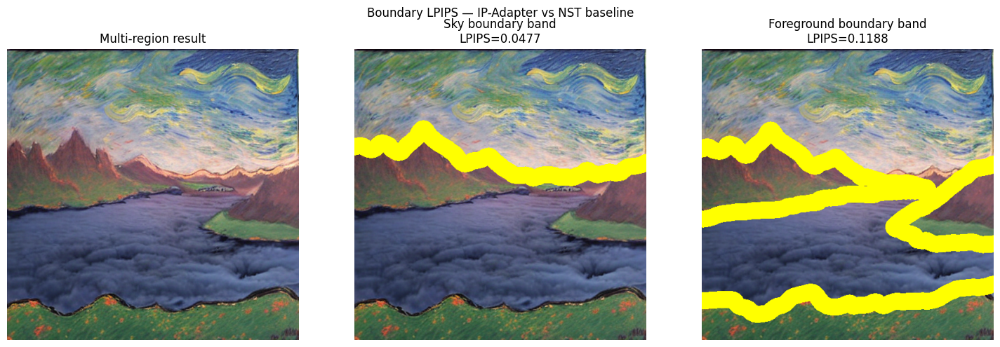

In [12]:
import lpips
lpips_fn = lpips.LPIPS(net='alex').to(DEVICE)

lpips_sky_ip  = boundary_band_lpips(lpips_fn, content, result_multi, mask_sky)
lpips_fore_ip = boundary_band_lpips(lpips_fn, content, result_multi, mask_fore)

# Phase 2 NST baseline for comparison
NST_SKY  = 0.0758
NST_FORE = 0.1627

print(f'\n{"="*55}')
print(f'  BOUNDARY LPIPS: IP-Adapter vs NST Baseline')
print(f'{"="*55}')
print(f'{"region":<20} {"IP-Adapter":>12} {"NST baseline":>14} {"delta"}')
print(f'{"-"*55}')
print(f'{"sky":<20} {lpips_sky_ip:>12.4f} {NST_SKY:>14.4f}  {NST_SKY-lpips_sky_ip:+.4f}')
print(f'{"foreground":<20} {lpips_fore_ip:>12.4f} {NST_FORE:>14.4f}  {NST_FORE-lpips_fore_ip:+.4f}')
print(f'{"="*55}')
print('positive delta = IP-Adapter has less boundary leakage than NST')

def overlay_band(img, band, color=(255, 255, 0)):
    arr = np.array(img.convert('RGB')).copy()
    arr[band > 127] = color
    return Image.fromarray(arr)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(result_multi)
axes[0].set_title('Multi-region result')
axes[0].axis('off')
axes[1].imshow(overlay_band(result_multi, make_boundary_band(mask_sky)))
axes[1].set_title(f'Sky boundary band\nLPIPS={lpips_sky_ip:.4f}')
axes[1].axis('off')
axes[2].imshow(overlay_band(result_multi, make_boundary_band(mask_fore)))
axes[2].set_title(f'Foreground boundary band\nLPIPS={lpips_fore_ip:.4f}')
axes[2].axis('off')
plt.suptitle('Boundary LPIPS — IP-Adapter vs NST baseline', fontsize=12)
plt.tight_layout()
plt.show()


## IP-Adapter scale sweep

`ip_scale` controls the balance between the reference image and the
text prompt in the cross-attention layers. Low values follow the text
more closely and preserve content structure, high values push strongly
toward the reference image style but can overwrite scene geometry.
Running a sweep to find the scale that gives the best boundary LPIPS
on the sky region before using it for the full pipeline.

ip_scale=0.3... 

  0%|          | 0/30 [00:00<?, ?it/s]

boundary LPIPS=0.0336
ip_scale=0.5... 

  0%|          | 0/30 [00:00<?, ?it/s]

boundary LPIPS=0.0324
ip_scale=0.7... 

  0%|          | 0/30 [00:00<?, ?it/s]

boundary LPIPS=0.0343
ip_scale=0.9... 

  0%|          | 0/30 [00:00<?, ?it/s]

boundary LPIPS=0.0371
best ip_scale: 0.5 (LPIPS=0.0324)


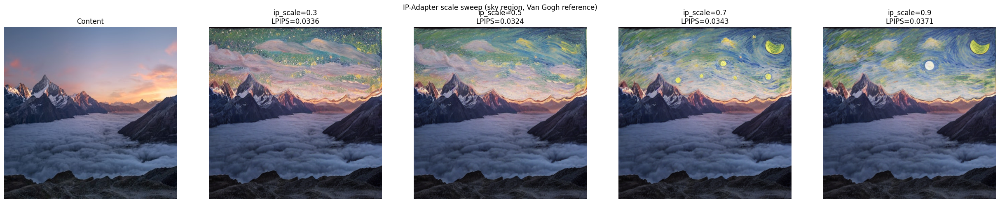

In [13]:
# ip_scale controls how strongly the reference image is injected through
# cross-attention vs following the text prompt
ip_scales= [0.3, 0.5, 0.7, 0.9]
scale_images = []
scale_lpips  = []

for scale in ip_scales:
    print(f'ip_scale={scale}...', end=' ', flush=True)
    res = inpaint_region(
        content_img=content,
        mask_arr=mask_sky,
        style_ref_img=style_sky,
        prompt='sky painted in impressionist style',
        ip_scale=scale,
    )
    bl = boundary_band_lpips(lpips_fn, content, res, mask_sky)
    scale_images.append(res)
    scale_lpips.append(bl)
    print(f'boundary LPIPS={bl:.4f}')

best_idx = scale_lpips.index(min(scale_lpips))
print(f'best ip_scale: {ip_scales[best_idx]} (LPIPS={scale_lpips[best_idx]:.4f})')

fig, axes = plt.subplots(1, len(ip_scales)+1, figsize=(5*(len(ip_scales)+1), 5))
axes[0].imshow(content); axes[0].set_title('Content'); axes[0].axis('off')
for i, (scale, res, bl) in enumerate(zip(ip_scales, scale_images, scale_lpips)):
    axes[i+1].imshow(res)
    axes[i+1].set_title(f'ip_scale={scale}\nLPIPS={bl:.4f}')
    axes[i+1].axis('off')
plt.suptitle('IP-Adapter scale sweep (sky region, Van Gogh reference)', fontsize=12)
plt.tight_layout()
plt.show()


## End-to-end pipeline test

Runs the full system from a natural language instruction through to
the final styled output. The instruction is parsed into region-style
pairs, each region is looked up in the mask and style reference maps,
and inpainting runs sequentially using the best ip_scale found above.
This is the complete pipeline as described in the methodology.

instruction: "style the sky like Van Gogh and the mountain like Monet"
parsed: [{'region': 'sky', 'style': 'Van Gogh'}, {'region': 'mountain', 'style': 'Monet'}]
inpainting "sky" -> "Van Gogh"


  0%|          | 0/30 [00:00<?, ?it/s]

inpainting "mountain" -> "Monet"


  0%|          | 0/30 [00:00<?, ?it/s]

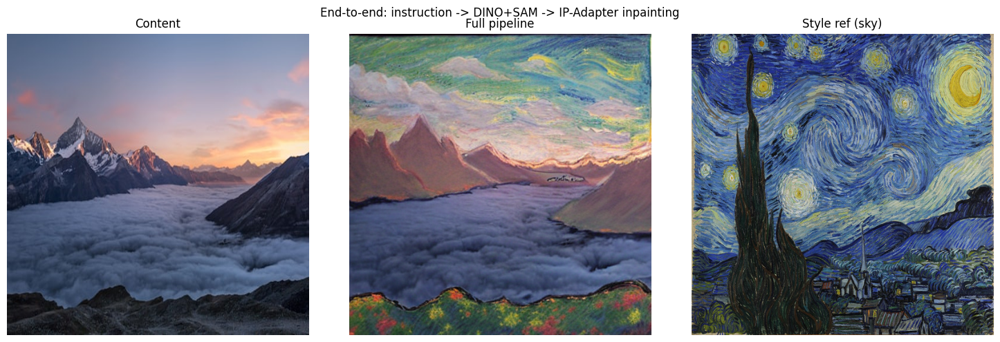

full pipeline done


In [14]:
STYLE_REFS = {
    'Van Gogh': style_sky,
    'Monet':style_fore,
}

REGION_PROMPTS = {
    'sky':'sky painted in impressionist oil painting style',
    'mountain':'mountains landscape impressionist painting style',
    'mountains': 'mountains landscape impressionist painting style',
    'forest':'forest trees impressionist painting style',
    'water':'water reflections impressionist painting style',
}

REGION_MASKS = {
    'sky':mask_sky,
    'mountain':mask_fore,
    'mountains': mask_fore,
}

instruction = 'style the sky like Van Gogh and the mountain like Monet'
print(f'instruction: "{instruction}"')
pairs = parse_instruction(instruction)
print(f'parsed: {pairs}')

current = content.copy()
for pair in pairs:
    region= pair['region']
    style_name = pair['style']
    style_ref  = STYLE_REFS.get(style_name)
    mask= REGION_MASKS.get(region)
    if style_ref is None or mask is None or mask.sum() == 0:
        print(f'skipping "{region}" -> "{style_name}"')
        continue
    prompt = REGION_PROMPTS.get(region, 'artistic style painting')
    print(f'inpainting "{region}" -> "{style_name}"')
    current = inpaint_region(
        content_img=current,
        mask_arr=mask,
        style_ref_img=style_ref,
        prompt=prompt,
        ip_scale=ip_scales[best_idx],
    )

current.save(f'{OUT_DIR}/full_pipeline_result.png')

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(content);  axes[0].set_title('Content');axes[0].axis('off')
axes[1].imshow(current);  axes[1].set_title('Full pipeline');  axes[1].axis('off')
axes[2].imshow(style_sky);axes[2].set_title('Style ref (sky)');axes[2].axis('off')
plt.suptitle('End-to-end: instruction -> DINO+SAM -> IP-Adapter inpainting', fontsize=12)
plt.tight_layout()
plt.show()
print('full pipeline done')


In [15]:
summary = {
    'model':'SD1.5-Inpainting + IP-Adapter',
    'backbone':'runwayml/stable-diffusion-inpainting',
    'ip_adapter':'h94/IP-Adapter (ip-adapter_sd15.bin)',
    'grounding':'GroundingDINO + SAM ViT-H',
    'results': {
        'sky_boundary_lpips':round(lpips_sky_ip,  4),
        'fore_boundary_lpips':round(lpips_fore_ip, 4),
        'nst_sky_baseline':NST_SKY,
        'nst_fore_baseline':NST_FORE,
        'best_ip_scale':ip_scales[best_idx],
    },
    'created_at': datetime.now().isoformat(),
}
with open(f'{OUT_DIR}/summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*55}')
print(f'  FINAL SUMMARY')
print(f'{"="*55}')
print(f'sky boundary LPIPS:{lpips_sky_ip:.4f}  (NST was {NST_SKY})')
print(f'foreground boundary LPIPS: {lpips_fore_ip:.4f}  (NST was {NST_FORE})')
print(f'best IP-Adapter scale:{ip_scales[best_idx]}')
print(f'outputs saved to: {OUT_DIR}')
print(f'{"="*55}')



  FINAL SUMMARY
sky boundary LPIPS:0.0477  (NST was 0.0758)
foreground boundary LPIPS: 0.1188  (NST was 0.1627)
best IP-Adapter scale:0.5
outputs saved to: /homes/rkr44/mllm_style_transfer/ip_adapter/outputs
